In [1]:
# This program is a pretty basic implementation of the bertopic topic modeling, but also includes
# a step that distributes the -1 chunks to the most likely topic based on distribution. There is also 
# an option to do that using probabilities (which might actually be better)
# The countvectorized step allows the application of a stopword filter.

In [2]:
#these are the necessary preliminary imports
import pandas as pd
import numpy as np
pd.set_option('display.max_rows', 200)
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.io as pio
pio.renderers.default='iframe'
from bertopic import BERTopic
from bertopic.vectorizers import ClassTfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
import os
os.environ["HUGGINGFACE_CO_TIMEOUT"] = "600"  # Increase timeout duration to 600 seconds
os.environ["TOKENIZERS_PARALLELISM"] = "false"
import hdbscan
import matplotlib.pyplot as plt
from umap import UMAP
from copy import deepcopy

# this is for generating the bipartite graph
import networkx as nx
from networkx.algorithms import bipartite
from networkx.readwrite import graphml

/home/tango/anaconda3/envs/bertopic/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning:

The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.

/home/tango/anaconda3/envs/bertopic/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning:

The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.

/home/tango/anaconda3/envs/bertopic/lib/python3.9/site-packages/umap/distances.py:1086: NumbaDep

In [3]:
!ls

aggregated_bipartite_network.csv  thiele_chunker.ipynb
danish_stopwords.txt		  thiele_exp2_bipartite_network.graphml
edges.csv			  thiele_experiment_01.ipynb
iframe_figures			  thiele_experiment_02.ipynb
story_projection.graphml	  thiele_legend_stories.csv
thiele_bipartite_network.graphml  topiclist.csv
thiele_chunked_stories.csv	  topics_docs.csv


In [4]:
# setting up various data frames
thiele_df = pd.read_csv('./thiele_legend_stories.csv')
thiele_df

chunked_df = pd.read_csv('./thiele_chunked_stories.csv')
chunked_df

,id,story_id,vol,sec,sub,title,text,annot
0,1_1,1,1,1,1,Hvordan Sjælland blev til,"på den tid da kong gylfe regerede i sverige , ...","Edda Islandor, cura Resenii, fab. I. Snorro, H..."
1,1_2,1,1,1,1,Hvordan Sjælland blev til,"havde avlet med en kæmpe i jotunheim , omskabt...","Edda Islandor, cura Resenii, fab. I. Snorro, H..."
2,1_3,1,1,1,1,Hvordan Sjælland blev til,"sund og blev den ø , der hedder sjælland . men...","Edda Islandor, cura Resenii, fab. I. Snorro, H..."
3,2_1,2,1,1,1,Kong Angels høj,i den østlige ende af dybe sogn i ringkøbing a...,"Danske Atlas V, 819 tilføjer: »Andre kilder fo..."
4,2_2,2,1,1,1,Kong Angels høj,trække sig tilbage lokkede englænderne længere...,"Danske Atlas V, 819 tilføjer: »Andre kilder fo..."
...,...,...,...,...,...,...,...,...
2592,900_4,900,2,2,5,Jerusalems skomager i Jylland I,"skete , som han havde sagt , for da der engang...",NaN
2593,900_5,900,2,2,5,Jerusalems skomager i Jylland I,"og bundet sin hest uden for ovnen , red han de...",NaN
2594,900_6,900,2,2,5,Jerusalems skomager i Jylland I,drenge drillede ham og en af dem kastede en tø...,NaN
2595,901_1,901,2,2,5,Jerusalems skomager i Jylland II,"det fortælles , at der engang kom en langskægg...",Jfr. Wolfs Encom. Regn. Dan. 78 ff. Res. Atl. ...


In [5]:
# these are representation models -- ctfidf and MMR
ctfidf_model = ClassTfidfTransformer(bm25_weighting=True, reduce_frequent_words=True)
from bertopic.representation import MaximalMarginalRelevance
representation_model = MaximalMarginalRelevance(diversity=0.5)

In [6]:
# setting up the hdbscan model; set the minimum cluster size here
from hdbscan import HDBSCAN
hdbscan_model = HDBSCAN(min_cluster_size=10, prediction_data = True)

In [7]:
# setting up the umap model. The n_neighbors is quite sensitive. the components set to 5 makes sense given the 
# dimensionality reduction approach. Random_state is just so that each run is the same.
from umap import UMAP
umap_model = UMAP(n_neighbors=5, n_components=5, min_dist=0.0, metric='cosine', random_state=42)

In [8]:
docs = chunked_df['text']
docs.head()

0    på den tid da kong gylfe regerede i sverige , ...
1    havde avlet med en kæmpe i jotunheim , omskabt...
2    sund og blev den ø , der hedder sjælland . men...
3    i den østlige ende af dybe sogn i ringkøbing a...
4    trække sig tilbage lokkede englænderne længere...
Name: text, dtype: object

In [9]:
title = chunked_df['title']
title.head()

0    Hvordan Sjælland blev til
1    Hvordan Sjælland blev til
2    Hvordan Sjælland blev til
3              Kong Angels høj
4              Kong Angels høj
Name: title, dtype: object

In [10]:
# this is the main embedding step--one needs the SentenceTransformer. One can swap out the sentence_model here.
from sentence_transformers import SentenceTransformer
sentence_model = SentenceTransformer("../andersen/Code_ver_02/dfm-sentence-encoder-medium-2")
# this allows one to store the embeddings
embeddings = sentence_model.encode(docs, show_progress_bar=True)

Batches:   0%|          | 0/82 [00:00<?, ?it/s]

In [11]:
# this is the main topic modeling step. calculate_probabilities can be set to false or true. 
# you can force the number of topics in this step
thiele_min10_topic_model = BERTopic(language='danish', calculate_probabilities=True, representation_model = representation_model, umap_model=umap_model, hdbscan_model=hdbscan_model, embedding_model="all-MiniLM-L6-v2", top_n_words=10, min_topic_size=10, nr_topics= None, ctfidf_model=ctfidf_model, verbose=True)
# thiele_min10_topic_model = BERTopic(language='danish', calculate_probabilities=True, umap_model=umap_model, hdbscan_model=hdbscan_model, embedding_model="all-MiniLM-L6-v2", top_n_words=10, min_topic_size=10, nr_topics= None, ctfidf_model=ctfidf_model, verbose=True)
# topics, probs = parler_concat_topic_model.fit_transform(docs, embeddings)
topics, probs = thiele_min10_topic_model.fit_transform(docs)

2024-05-30 09:26:05,720 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/82 [00:00<?, ?it/s]

2024-05-30 09:26:07,607 - BERTopic - Embedding - Completed ✓
2024-05-30 09:26:07,608 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
/home/tango/anaconda3/envs/bertopic/lib/python3.9/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning:

The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.

2024-05-30 09:26:17,657 - BERTopic - Dimensionality - Completed ✓
2024-05-30 09:26:17,658 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-05-30 09:26:17,897 - BERTopic - Cluster - Completed ✓
2024-05-30 09:26:17,900 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-05-30 09:26:18,582 - BERTopic - Representation - Completed ✓


In [12]:
thiele_min10_topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1128,-1_skal_hans_sagde_jeg,"[skal, hans, sagde, jeg, ville, kunne, hvad, n...","[idet hun sagde : din stakkel , jeg ser , at d..."
1,0,175,0_bygget_kirker_revet_klokkerne,"[bygget, kirker, revet, klokkerne, kapel, årsa...","[dengang skamby kirke på fyn blev bygget , måt..."
2,1,141,1_skulle_munk_hans_kommet,"[skulle, munk, hans, kommet, bundløse, hovedet...",[og skulle nu begraves på kirkegården . men ne...
3,2,127,2_hende_dodt_pippe_sit,"[hende, dodt, pippe, sit, omkring, brød, stykk...","[til noget , og nærmede sig kirkedøren . der l..."
4,3,66,3_skibe_biblioteket_skikkelsen_margrethes,"[skibe, biblioteket, skikkelsen, margrethes, l...","[under ålborg by går der mange løngange , som ..."
5,4,62,4_ligger_syv_begravet_hjarnø,"[ligger, syv, begravet, hjarnø, bakke, ollerup...",[på østsiden af hjarnø ligger der på den flade...
6,5,52,5_skulle_tune_odin_ladegård,"[skulle, tune, odin, ladegård, misundelig, der...",[. engang skulle man nemlig vælge en konge på ...
7,6,49,6_pølse_hat_huggede_værebro,"[pølse, hat, huggede, værebro, vrangstrup, træ...","[da tænkte drengen , at sådan en hat måtte vær..."
8,7,46,7_lille_rise_hund_rug,"[lille, rise, hund, rug, bolbro, lærred, urteg...","[han vendte sig om , så han en lille mand med ..."
9,8,45,8_ligger_haverup_består_dragen,"[ligger, haverup, består, dragen, bevokset, sv...",[på julstrup præstegård ved alborg havde man e...


In [13]:
# this updates the topics using various strategies. Often c-tf-idf works best. One can also use the "probabilities" strategy as well.
# to use the probabilities, it would look something like new_topics = topic_model.reduce_outliers(docs, topics, probabilities=probs, strategy="probabilities")
# new_topics = thiele_min10_topic_model.reduce_outliers(docs, topics, strategy="distributions")
new_topics = thiele_min10_topic_model.reduce_outliers(docs, topics, strategy="c-tf-idf")
# new_topics = thiele_min10_topic_model.reduce_outliers(docs, topics, probabilities=probs, strategy="probabilities")

In [14]:
thiele_updated_model = thiele_min10_topic_model
thiele_updated_model.update_topics(docs, topics=new_topics)

2024-05-30 09:26:42,662 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [15]:
thiele_updated_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,289,0_kirke_kirken_der_den,"[kirke, kirken, der, den, på, og, en, at, blev...","[dengang skamby kirke på fyn blev bygget , måt..."
1,1,294,1_ham_han_at_og,"[ham, han, at, og, til, da, sig, for, men, havde]",[og skulle nu begraves på kirkegården . men ne...
2,2,212,2_hun_og_at_hende,"[hun, og, at, hende, til, da, en, det, sig, men]","[til noget , og nærmede sig kirkedøren . der l..."
3,3,80,3_de_en_og_sig,"[de, en, og, sig, der, at, som, den, for, til]","[under ålborg by går der mange løngange , som ..."
4,4,105,4_ligger_der_en_på,"[ligger, der, en, på, har, høj, er, ved, kalde...",[på østsiden af hjarnø ligger der på den flade...
5,5,73,5_skulle_de_at_den,"[skulle, de, at, den, der, og, til, hans, en, på]",[. engang skulle man nemlig vælge en konge på ...
6,6,120,6_han_og_at_da,"[han, og, at, da, havde, til, men, så, den, på]","[da tænkte drengen , at sådan en hat måtte vær..."
7,7,88,7_lille_en_og_han,"[lille, en, og, han, det, jeg, på, da, at, var]","[han vendte sig om , så han en lille mand med ..."
8,8,63,8_der_ligger_er_en,"[der, ligger, er, en, den, kaldes, af, på, fra...",[på julstrup præstegård ved alborg havde man e...
9,9,88,9_det_de_og_at,"[det, de, og, at, da, med, var, han, på, nu]","[en hyrdedreng til det , og for en sikkerheds ..."


In [16]:
# here we apply the countvectorized with danish stopwords to get a better labeling
with open('./danish_stopwords.txt', 'r') as f:
    danish_stop_words = f.read().splitlines()
# # travel_dan_vectorizer_model = CountVectorizer(stop_words=dan_stop_words, ngram_range=(1, 4), min_df=7)
thiele_vectorizer_model = CountVectorizer(stop_words=danish_stop_words, ngram_range=(1, 3), min_df=5)

In [17]:
thiele_min10_topic_model.update_topics(docs, topics=topics, vectorizer_model=thiele_vectorizer_model)

2024-05-30 09:26:57,406 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [21]:
thiele_updated_model.update_topics(docs, topics=new_topics, vectorizer_model=thiele_vectorizer_model)

2024-05-30 09:28:56,328 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [19]:
thiele_min10_topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1128,-1_navn_tid_sted_mand,"[navn, tid, sted, mand, kongen, siden, tre, jo...","[idet hun sagde : din stakkel , jeg ser , at d..."
1,0,175,0_kirke_kirken_bygget_bygge,"[kirke, kirken, bygget, bygge, to, boede, kirk...","[dengang skamby kirke på fyn blev bygget , måt..."
2,1,141,1_præsten_komme_døren_sidst,"[præsten, komme, døren, sidst, døde, stod, imo...",[og skulle nu begraves på kirkegården . men ne...
3,2,127,2_hus_stykke_hørte_både,"[hus, stykke, hørte, både, sige, byen, sad, br...","[til noget , og nærmede sig kirkedøren . der l..."
4,3,66,3_skibet_holger_gange_gang,"[skibet, holger, gange, gang, skibe, løb, uden...","[under ålborg by går der mange løngange , som ..."
5,4,62,4_høj_begravet_mellem_syv,"[høj, begravet, mellem, syv, sten, bakke, gård...",[på østsiden af hjarnø ligger der på den flade...
6,5,52,5_ni_rotter_enige_by,"[ni, rotter, enige, by, folkene, daae, to, der...",[. engang skulle man nemlig vælge en konge på ...
7,6,49,6_hat_lige_præsten_svaret,"[hat, lige, præsten, svaret, set, træet, først...","[da tænkte drengen , at sådan en hat måtte vær..."
8,7,46,7_hund_stod_bonden_manden,"[hund, stod, bonden, manden, gud, ærø, stående...","[han vendte sig om , så han en lille mand med ..."
9,8,45,8_høj_svendborg_ålborg_mellem,"[høj, svendborg, ålborg, mellem, st, møn, bakk...",[på julstrup præstegård ved alborg havde man e...


In [22]:
thiele_updated_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,289,0_kirke_kirken_bygget_sted,"[kirke, kirken, bygget, sted, bygge, to, sten,...","[dengang skamby kirke på fyn blev bygget , måt..."
1,1,294,1_præsten_kongen_komme_sidst,"[præsten, kongen, komme, sidst, stod, slog, sa...",[og skulle nu begraves på kirkegården . men ne...
2,2,212,2_byen_hus_hørte_først,"[byen, hus, hørte, først, dag, lod, brød, stor...","[til noget , og nærmede sig kirkedøren . der l..."
3,3,80,3_skibet_holger_gange_gang,"[skibet, holger, gange, gang, uden, lod, løb, ...","[under ålborg by går der mange løngange , som ..."
4,4,105,4_høj_sten_navn_gård,"[høj, sten, navn, gård, begravet, to, gamle, s...",[på østsiden af hjarnø ligger der på den flade...
5,5,73,5_ni_daae_rotter_enige,"[ni, daae, rotter, enige, folkene, navn, faldt...",[. engang skulle man nemlig vælge en konge på ...
6,6,120,6_falster_præsten_henrik_hat,"[falster, præsten, henrik, hat, karlen, røvere...","[da tænkte drengen , at sådan en hat måtte vær..."
7,7,88,7_gud_manden_måle_jesu,"[gud, manden, måle, jesu, stod, hund, mand, he...","[han vendte sig om , så han en lille mand med ..."
8,8,63,8_høj_spor_mark_pedersborg,"[høj, spor, mark, pedersborg, mellem, ålborg, ...",[på julstrup præstegård ved alborg havde man e...
9,9,88,9_drengen_hvile_nissen_trak,"[drengen, hvile, nissen, trak, satte, derpå, b...","[en hyrdedreng til det , og for en sikkerheds ..."


In [23]:
# here we reduce the embeddings to 2 dimensions so that we can make a better visualization
reduced_embeddings = UMAP(n_neighbors=5, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
fig = thiele_updated_model.visualize_documents(title, reduced_embeddings=reduced_embeddings)
fig.show()

In [25]:
# here we make a deepcopy of the topic model so we can apply the mmr labeling
mmr_model = deepcopy(thiele_updated_model)
# and apply the mmr labeling along with the stopword countvectorizer
mmr_model.update_topics(docs, representation_model=representation_model, vectorizer_model=thiele_vectorizer_model)
# extract the new labels
mmr_info = mmr_model.get_topic_info()
# and add these labels to the existing dataframe after getting the original info
original_ctfidf_info = thiele_updated_model.get_topic_info()
# Combine all representations into a single DataFrame
combined_df = pd.DataFrame({
          'Topic': original_ctfidf_info['Topic'],
          'Count': original_ctfidf_info['Count'],
          'cTFIDF': original_ctfidf_info['Name'],
#             'KeyBert': keybert_info['Name'],
#             'KeyBert_lem':keybertlem_info['Name'],
#             'DaCY_PoS': pos_info['Name'],
          'MMR': mmr_info['Name'],
      })


In [26]:
# check the quality of the mmr labeling against stop-worded cTFIDF
combined_df

,Topic,Count,cTFIDF,MMR
0,0,289,0_kirke_kirken_bygget_sted,0_sted_kirkegård_står_tårnet
1,1,294,1_præsten_kongen_komme_sidst,1_præsten_kongen_sidst_stod
2,2,212,2_byen_hus_hørte_først,2_hus_først_stor_vognen
3,3,80,3_skibet_holger_gange_gang,3_skibet_gange_lod_næppe
4,4,105,4_høj_sten_navn_gård,4_høj_gård_sted_stor
5,5,73,5_ni_daae_rotter_enige,5_rotter_enige_siden_præst
6,6,120,6_falster_præsten_henrik_hat,6_falster_røveren_lige_bort
7,7,88,7_gud_manden_måle_jesu,7_manden_stod_mand_øl
8,8,63,8_høj_spor_mark_pedersborg,8_mark_pedersborg_mellem_skov
9,9,88,9_drengen_hvile_nissen_trak,9_trak_satte_bare_næste


In [27]:
# working on getting probability lists and created the probability dataframe, prob_df
def get_probs(model):
    probs = hdbscan.all_points_membership_vectors(model.hdbscan_model)
    prob_df = pd.DataFrame(model._map_probabilities(probs, original_topics=True)).transpose()
    return prob_df

In [29]:
# create a probability list
prob_list = []
# remember to change the model here
prob_list.append(get_probs(thiele_updated_model))

In [30]:
# create the doc_df dataframe to use in the next step

In [31]:
# get documents for each topic from model
def extract_docs_per_topic(doc_df, prob_df, n, multi_text=True):
    '''
    Extract the first n documents corresponding to each topic as fitted by the model 
    according to the probability scores. 
    '''
    col_names = ['Topic '+str(i) for i in range(prob_df.shape[0])]
    docs_per_topic_df = pd.DataFrame(columns=col_names, index=range(n))
    if multi_text is True: 
        stories_per_topic_df = pd.DataFrame(columns=col_names, index=range(n))
    ind_list = []
    for i in range(prob_df.shape[0]):
        ind_list = list(prob_df.sort_values(by=i, axis=1, ascending=False).iloc[:, :n].columns)
        doc_list = []
        if multi_text is True: 
            stories_list = []
        for j in ind_list:
            doc_list.append(doc_df.iloc[j, 0])
            if multi_text is True: 
                stories_list.append(doc_df.iloc[j, 1])
        docs_per_topic_df['Topic '+str(i)] = doc_list
        if multi_text is True: 
            stories_per_topic_df['Topic '+str(i)] = story_list
            joint_df = docs_per_topic_df.join(
                stories_per_topic_df, lsuffix='_doc', rsuffix='_text_name').sort_index(axis=1)
    if multi_text is True: 
        return docs_per_topic_df, stories_per_topic_df, joint_df
    return docs_per_topic_df

In [32]:
# create the hierarchical listing of the topics
hierarchical_topics = thiele_updated_model.hierarchical_topics(docs)

100%|██████████████████████████████████████████| 43/43 [00:00<00:00, 295.01it/s]


In [33]:
# hierarchical clustering of the topic model space
thiele_updated_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

In [34]:
thiele_updated_model.visualize_hierarchical_documents(title, hierarchical_topics, reduced_embeddings=reduced_embeddings, hide_document_hover=False)

In [35]:
thiele_updated_model.visualize_heatmap(n_clusters = 12)

In [36]:
thiele_updated_model.visualize_topics()

In [37]:
# creating a documents dataframe for the network graph creation and the concatenation step
documents_df = chunked_df
topics_df = thiele_updated_model.get_document_info(docs)

In [38]:
# adding some more information to documents_df, specifically columns adding classifications based on volume, section and subsection
# Create the class_1 column by concatenating vol and sec with an underscore
documents_df['class_1'] = chunked_df['vol'].astype(str) + '_' + chunked_df['sec'].astype(str)

# Create the class_2 column by concatenating vol, sec, and subsec with underscores
documents_df['class_2'] = chunked_df['vol'].astype(str) + '_' + chunked_df['sec'].astype(str) + '_' + chunked_df['sub'].astype(str)

# Display the DataFrame
documents_df

,id,story_id,vol,sec,sub,title,text,annot,class_1,class_2
0,1_1,1,1,1,1,Hvordan Sjælland blev til,"på den tid da kong gylfe regerede i sverige , ...","Edda Islandor, cura Resenii, fab. I. Snorro, H...",1_1,1_1_1
1,1_2,1,1,1,1,Hvordan Sjælland blev til,"havde avlet med en kæmpe i jotunheim , omskabt...","Edda Islandor, cura Resenii, fab. I. Snorro, H...",1_1,1_1_1
2,1_3,1,1,1,1,Hvordan Sjælland blev til,"sund og blev den ø , der hedder sjælland . men...","Edda Islandor, cura Resenii, fab. I. Snorro, H...",1_1,1_1_1
3,2_1,2,1,1,1,Kong Angels høj,i den østlige ende af dybe sogn i ringkøbing a...,"Danske Atlas V, 819 tilføjer: »Andre kilder fo...",1_1,1_1_1
4,2_2,2,1,1,1,Kong Angels høj,trække sig tilbage lokkede englænderne længere...,"Danske Atlas V, 819 tilføjer: »Andre kilder fo...",1_1,1_1_1
...,...,...,...,...,...,...,...,...,...,...
2592,900_4,900,2,2,5,Jerusalems skomager i Jylland I,"skete , som han havde sagt , for da der engang...",NaN,2_2,2_2_5
2593,900_5,900,2,2,5,Jerusalems skomager i Jylland I,"og bundet sin hest uden for ovnen , red han de...",NaN,2_2,2_2_5
2594,900_6,900,2,2,5,Jerusalems skomager i Jylland I,drenge drillede ham og en af dem kastede en tø...,NaN,2_2,2_2_5
2595,901_1,901,2,2,5,Jerusalems skomager i Jylland II,"det fortælles , at der engang kom en langskægg...",Jfr. Wolfs Encom. Regn. Dan. 78 ff. Res. Atl. ...,2_2,2_2_5


In [39]:
# creating a merged dataframe between the new documents data frame and the topics data frame
selected_columns = documents_df[['id','story_id', 'title', 'class_1', 'class_2']]
merged_df = topics_df.merge(selected_columns, left_index=True, right_index=True)

In [40]:
# creating the edgelist dataframe for the network creation
# Create the edge list for the bipartite graph
edges = []

for idx, row in merged_df.iterrows():
    story_id = row['story_id']
    story_label = row['title']
    story_class = row['class_1']
    story_sub = row['class_2']
    topic_id = row['Topic']
    rep_label = row['Representation']
    rep_label2 = row['Top_n_words']
    weight = row['Probability']
    edges.append((story_id, story_class, story_sub, story_label, topic_id, rep_label, rep_label2, weight))

# Convert to DataFrame
edges_df = pd.DataFrame(edges, columns=['story_id', 'story_class', 'story_sub', 'story_label', 'topic_id', 'topic_label', 'label2', 'weight'])

In [41]:
# # writing various dfs to csvs
# edges_df.to_csv('./exp2_edges.csv', index=False)
# topics_df.to_csv('./exp2_topics_docs.csv', index=True)
# topiclist_df = thiele_min10_topic_model.get_topic_info()
# topiclist_df.to_csv('./exp2_topiclist.csv')

In [42]:
# making an aggregated df that groups all the story chunks
aggregated_df = edges_df.groupby(['story_id', 'story_label', 'story_class', 'story_sub', 'topic_id', 'label2']).agg({'weight': 'sum'}).reset_index()

In [43]:
# Display the aggregated DataFrame
# aggregated_df

In [44]:
# defining the construction of a bipartite graph 
def bipartite_graph(df):
    B = nx.Graph()

    # Add story nodes
    for i, row in df.iterrows():
        story_node = f'story_{row["story_id"]}'
        topic_node = f'topic_{row["topic_id"]}'
        
        B.add_node(story_node, bipartite=0, label=row['story_label'], story_class=row['story_class'], sub=row['story_sub'])
        B.add_node(topic_node, bipartite=1, label=row['label2'])
        
        B.add_edge(story_node, topic_node, weight=row['weight'])

    return B

Total number of story nodes: 901
Total number of topic nodes: 44
Average degree of story nodes: 2.341842397336293
Average degree of topic nodes: 47.95454545454545


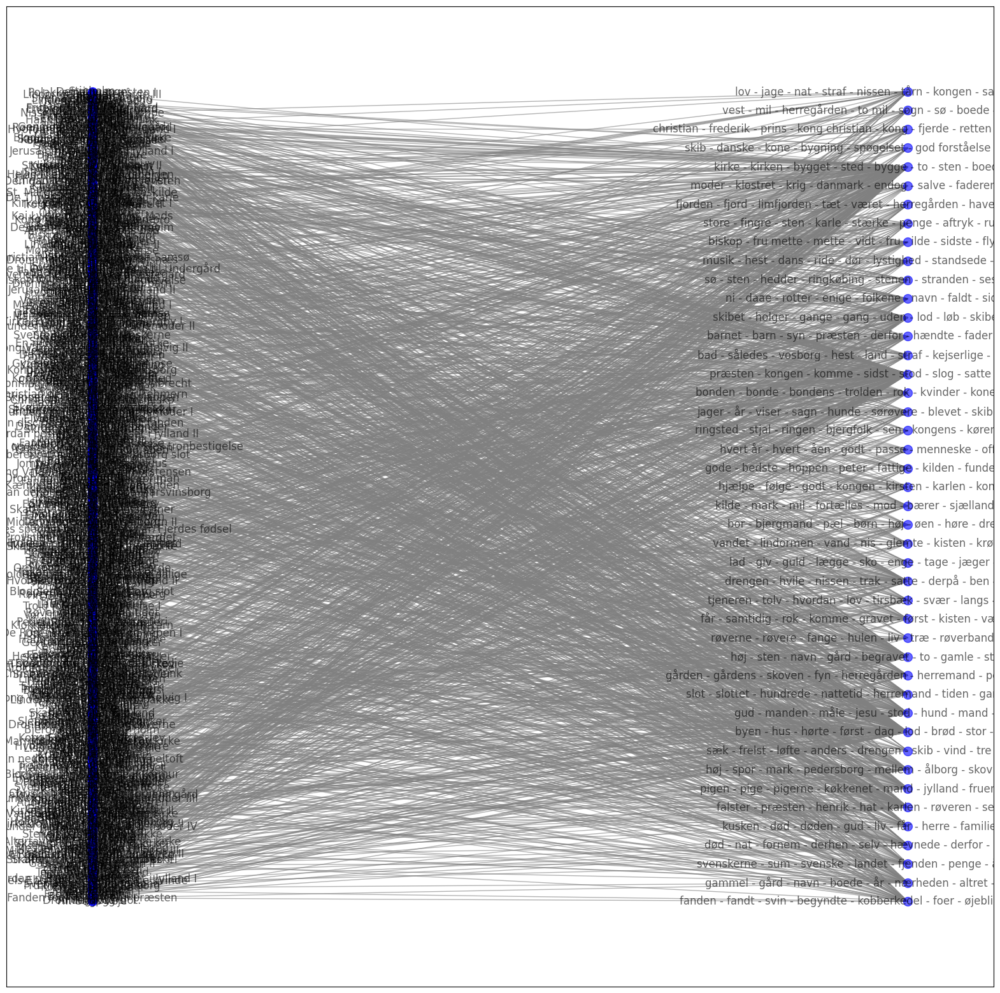

In [45]:
# drawing the bipartite graph 
B = bipartite_graph(aggregated_df)

# Calculate the degrees of all nodes
degrees = dict(B.degree())

# Separate the degrees of story nodes and topic nodes
story_degrees = [deg for node, deg in degrees.items() if node.startswith('story_')]
topic_degrees = [deg for node, deg in degrees.items() if node.startswith('topic_')]

# Calculate the average degree for story nodes and topic nodes
average_story_degree = sum(story_degrees) / len(story_degrees)
average_topic_degree = sum(topic_degrees) / len(topic_degrees)

# Count the total number of story nodes and topic nodes
total_story_nodes = len(story_degrees)
total_topic_nodes = len(topic_degrees)

print(f'Total number of story nodes: {total_story_nodes}')
print(f'Total number of topic nodes: {total_topic_nodes}')
print(f'Average degree of story nodes: {average_story_degree}')
print(f'Average degree of topic nodes: {average_topic_degree}')

# Drawing the graph
plt.figure(figsize=(20, 20))

# Generate positions for the bipartite layout
story_nodes = [f'story_{row["story_id"]}' for _, row in aggregated_df.iterrows()]
pos = nx.bipartite_layout(B, story_nodes)

# grab the node labels
labels = nx.get_node_attributes(B, 'label')

# Draw the graph
nx.draw_networkx(B, pos=pos, with_labels=True, labels=labels, node_size=100, edge_color='grey', node_color='blue', alpha=0.6)
plt.show()

In [46]:
# List topic nodes and their corresponding topic_id
topic_nodes = [(node, B.nodes[node]['label']) for node in B.nodes() if node.startswith('topic_')]

# Print topic nodes and their corresponding topic_id
for node, label in topic_nodes:
    print(f'{node}: {label}')

topic_2: byen - hus - hørte - først - dag - lod - brød - stor - vognen - stykke
topic_26: tjeneren - tolv - hvordan - lov - tirsbæk - svær - langs - år - svende - kræfter
topic_37: hvert år - hvert - åen - godt - passe - menneske - offer - sker - år - søen
topic_4: høj - sten - navn - gård - begravet - to - gamle - sted - stor - gården
topic_39: sø - sten - hedder - ringkøbing - stenen - stranden - ses - stor sten - stor - øst
topic_5: ni - daae - rotter - enige - folkene - navn - faldt - siden - befalede - by
topic_21: store - fingre - sten - karle - stærke - penge - aftryk - rundt - voksede - bordet
topic_0: kirke - kirken - bygget - sted - bygge - to - sten - boede - kirkegård - byen
topic_8: høj - spor - mark - pedersborg - mellem - ålborg - skov - bønderne - sø - møn
topic_40: biskop - fru mette - mette - vidt - fru - ilde - sidste - flytte - kender - komme
topic_41: ringsted - stjal - ringen - bjergfolk - sen - kongens - kørende - højen - sølv - gunst
topic_1: præsten - kongen - 

In [47]:
# Remove a specific topic node and its edges
topic_to_remove = 'topic_-1'  # Specify the topic node to remove
if topic_to_remove in B:
    B.remove_node(topic_to_remove)
    print(f'Topic {topic_to_remove} has been removed')


Total number of story nodes: 901
Total number of topic nodes: 44
Average degree of story nodes: 2.341842397336293
Average degree of topic nodes: 47.95454545454545


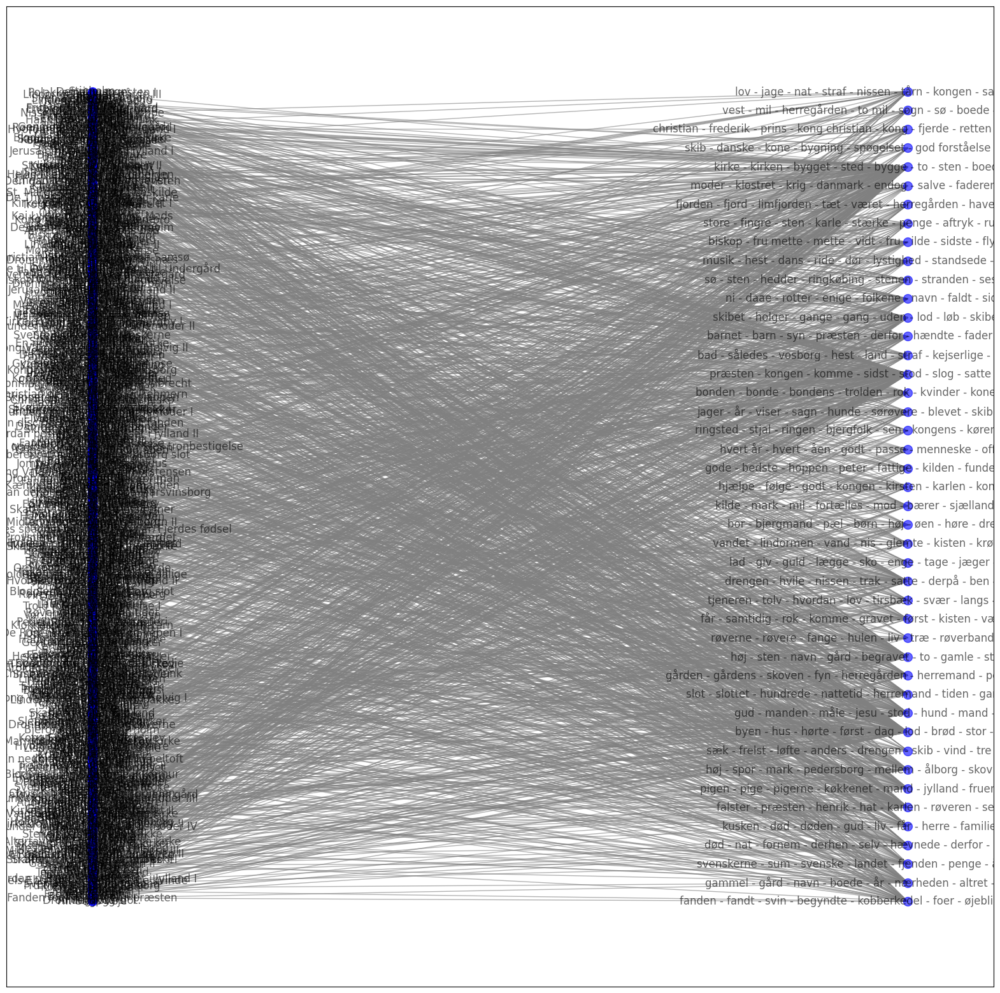

In [49]:
# redraw the graph without topic -1
# Calculate the degrees of all nodes
degrees = dict(B.degree())

# Separate the degrees of story nodes and topic nodes
story_degrees = [deg for node, deg in degrees.items() if node.startswith('story_')]
topic_degrees = [deg for node, deg in degrees.items() if node.startswith('topic_')]

# Calculate the average degree for story nodes and topic nodes
average_story_degree = sum(story_degrees) / len(story_degrees) if story_degrees else 0
average_topic_degree = sum(topic_degrees) / len(topic_degrees) if topic_degrees else 0

# Count the total number of story nodes and topic nodes
total_story_nodes = len(story_degrees)
total_topic_nodes = len(topic_degrees)

print(f'Total number of story nodes: {total_story_nodes}')
print(f'Total number of topic nodes: {total_topic_nodes}')
print(f'Average degree of story nodes: {average_story_degree}')
print(f'Average degree of topic nodes: {average_topic_degree}')

# Drawing the graph
plt.figure(figsize=(20, 20))

# Generate positions for the bipartite layout
story_nodes = [f'story_{row["story_id"]}' for _, row in aggregated_df.iterrows()]
pos = nx.bipartite_layout(B, story_nodes)

# grab the node labels
labels = nx.get_node_attributes(B, 'label')

# Draw the graph
nx.draw_networkx(B, pos=pos, with_labels=True, labels=labels, node_size=100, edge_color='grey', node_color='blue', alpha=0.6)
plt.show()

In [50]:
# export the bipartite graph
nx.write_graphml(B, './thiele_exp2_bipartite_network.graphml')

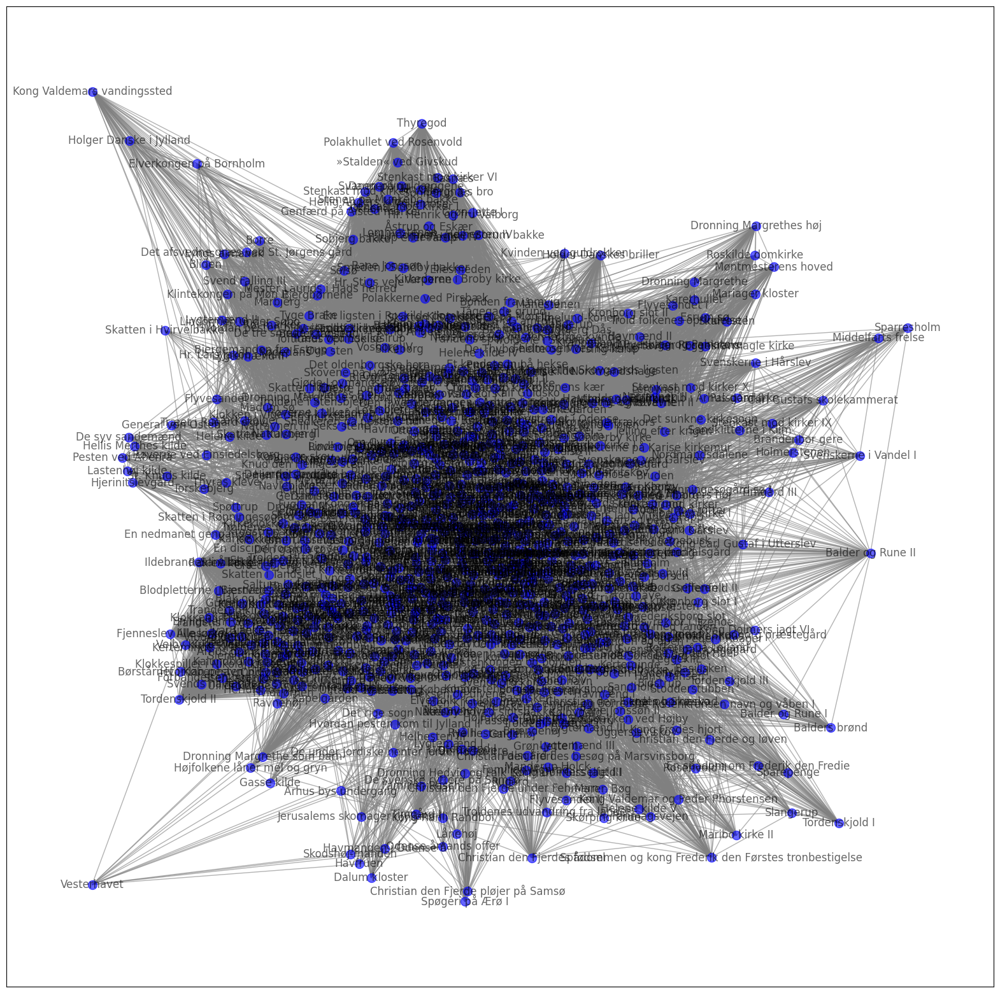

In [51]:
#project the graph into a single mode and draw it
# Correctly identify and list unique story nodes
story_nodes = [f'story_{row["story_id"]}' for _, row in aggregated_df.drop_duplicates('story_id').iterrows()]

# Project the bipartite graph onto the story nodes
story_projection = bipartite.weighted_projected_graph(B, story_nodes)

# Sum the weights for edges between stories based on shared topics and retain topic labels
for u, v, d in story_projection.edges(data=True):
    # Get the topics shared between u and v
    shared_topics = set(B[u]).intersection(set(B[v]))
    
    # Sum the weights of the shared topics and collect topic labels
    total_weight = 0
    topic_labels = []
    for topic in shared_topics:
        total_weight += B[u][topic]['weight']
        topic_labels.append(B.nodes[topic]['label'])
    
    d['weight'] = total_weight
    d['topic_labels'] = ', '.join(topic_labels)

# Drawing the graph
plt.figure(figsize=(20, 20))

# Generate positions for the layout
pos = nx.spring_layout(story_projection, k=0.1)

# Create labels dictionary for the nodes
node_labels = nx.get_node_attributes(story_projection, 'label')

# Create edge labels dictionary for the topic labels
edge_labels = nx.get_edge_attributes(story_projection, 'topic_labels')

# Draw the graph with labels
nx.draw_networkx(story_projection, pos=pos, labels=node_labels, node_size=100, edge_color='grey', node_color='blue', alpha=0.6)
# nx.draw_networkx_edge_labels(story_projection, pos=pos, edge_labels=edge_labels)
plt.show()

In [52]:
# Optionally, export the graph to a GraphML file
nx.write_graphml(story_projection, './exp2_story_projection.graphml')